

Mask R-CNN is a neural network that does image segmentation and also masking, where the detected images are covered with a layer of color to indicate being masked. Mask R-CNN first convoluted the input into a feature map. The feature map is then parsed into a region proposal network (RPN) to determine potential instances on the feature map. The feature map is also sent into a mask classifer to determine where to apply masks.



U-Net is a convolutional neural network that utilizes encoder and decoder to generate image segmentation. It is a fully convolutional as it does not contain any fully connected layers. The 'U' comes from the architecture of the network where the covolutions go down for several levels until it reach the latent space representation. Each level of convolution in the encoding phase, also known as downsampling, returns a smaller size input to the next layer but double the channels. This allows the U-Net to learn complex relationship in the data. In the decoding phase, also known as upsampling, the U-Net uses the result from the latent representation to form the masking for the image. U-Net also utilizes skip-connection to provide more information during the decoding phase as the features from each encoding layers are supportive in masking generation.



Intersection over untion is referred to comparison over two overlapping area map. In a deep learning settings, it is usually described in the context of image segmentation. Image segmentation is when a network tries to predict the bounding boxes of objects in an image. To confirm whether the predictions are correct, the training data usually contains ground-truth bounding boxes. Intersection over union then refers to comparing teh predicted bounding boxes and the ground-truth bounding boxes. IOU ranges from 0 to 1 where the more the grounding boxes overlap, the closer the value to 1 is.

Download the images from the attached zip folders “Train Image” and “Test Image” in the dataset`
- https://kaggle.com/datasets/2bda01d7e12fe659993c8b42f44427e58ac597c907a8bd450a10d853fb7d9828

In [ ]:
# !pip install kaggle

In [ ]:
# !kaggle datasets download -d smitvinodsavla/Airbus

In [ ]:
# !mkdir Airbus

In [ ]:
# !tar -xf Airbus.zip

In [ ]:
import os

In [ ]:
# Moving test images into one folder
try:
    te_dir = 'Test Image/untitled folder/'
    for i in range(1, 3):
        sub_dir = os.path.join(te_dir, f'test images {i}/')
        for f in os.listdir(sub_dir):
            os.rename(os.path.join(sub_dir, f), os.path.join('Test Image/', f))
        os.rmdir(sub_dir)
    os.rmdir(te_dir)
    os.rename('Test Image', 'Test images')
except:
    print('Test images are moved')

Test images are moved


In [ ]:
# Moving traing images into one folder
try:
    tr_dir = 'Train Image1/TI/'
    for i in range(1, 7):
        sub_dir = os.path.join(tr_dir, f'train images {i}/')
        for f in os.listdir(sub_dir):
            os.rename(os.path.join(sub_dir, f), os.path.join('Train Image1/', f))
        os.rmdir(sub_dir)
    os.rmdir(tr_dir)
    os.rename('Train Image1', 'Train images')
except:
    print('Train images are moved')

Train images are moved


Download the ‘train_df.csv’ (it contains the image id and the corresponding pixels where the ship is present (NaN when there is no ship)).`

In [ ]:
import pandas as pd

In [ ]:
mask_df = pd.read_csv('train_df.csv', index_col=0)

print(mask_df.head(10))

         ImageId                                      EncodedPixels
0  00003e153.jpg                                                NaN
1  0001124c7.jpg                                                NaN
2  000155de5.jpg  264661 17 265429 33 266197 33 266965 33 267733...
3  0001b1832.jpg                                                NaN
4  00021ddc3.jpg  108287 1 109054 3 109821 4 110588 5 111356 5 1...
5  00021ddc3.jpg  101361 1 102128 3 102896 4 103663 6 104430 9 1...
6  00021ddc3.jpg  74441 3 75207 5 75975 5 76743 5 77511 5 78280 ...
7  00021ddc3.jpg  74444 4 75212 4 75980 4 76748 4 77517 3 78285 ...
8  00021ddc3.jpg  150423 2 151190 3 151958 3 152726 4 153495 3 1...
9  00021ddc3.jpg  139644 2 140408 6 141174 9 141942 9 142711 6 1...


In [ ]:
from skimage.io import imread

In [ ]:
# using the first image from train_df to check shape
img = imread("Train images/00003e153.jpg")
img.shape

(768, 768, 3)

In [ ]:
im_dim = (img.shape[0], img.shape[1])

In [ ]:
mask_df['has_ship'] = mask_df['EncodedPixels'].isna().replace({True: 0, False: 1})

In [ ]:
count_ships = mask_df[['ImageId', 'has_ship']].groupby(by='ImageId').sum().reset_index().rename(columns={'has_ship': 'ships'})

In [ ]:
count_ships['ships'].value_counts()

ships
0     125935
1      22802
2       6490
3       2477
4       1359
5        778
6        554
7        342
8        264
9        207
10       132
11       128
12        96
13        62
15        61
14        60
Name: count, dtype: int64

In [ ]:
import matplotlib.pyplot as plt

Text(0.5, 1.0, '65812 masks')

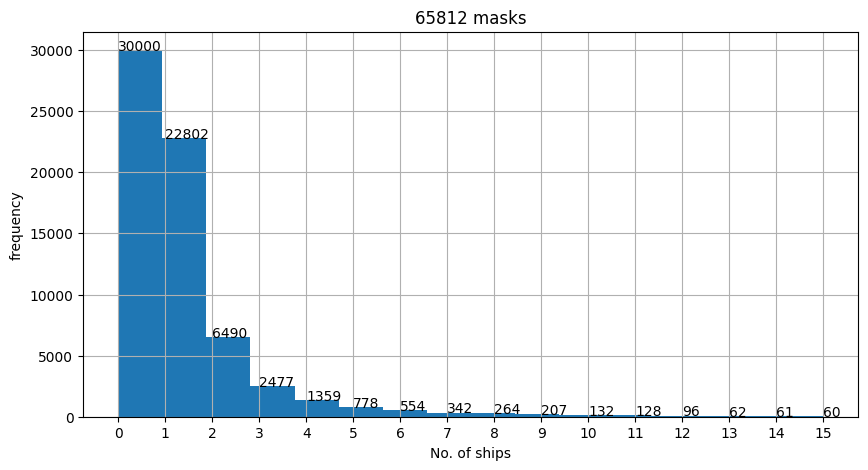

In [ ]:
# Undersample - so that the images that have no ship won't be too dominant that overfitted the model
SAMPLES_PER_GROUP = 30000
undersample_df = count_ships.groupby(by='ships').apply(lambda x: x.sample(SAMPLES_PER_GROUP) if len(x) > SAMPLES_PER_GROUP else x).reset_index(drop=True)

ax = undersample_df['ships'].astype(str).hist(bins=undersample_df['ships'].max() + 1, figsize=(10, 5))
for i, freq in enumerate(undersample_df['ships'].value_counts()):
    ax.text(i, freq + 1, freq)
ax.set_ylabel('frequency')
ax.set_xlabel('No. of ships')
ax.set_title(f'{undersample_df.shape[0]} masks')

In [ ]:
first_imgs_each_count = undersample_df.groupby(by='ships').head(3).reset_index()
first_imgs_each_count.drop(columns='index', inplace=True)
first_imgs_each_count = first_imgs_each_count.sort_values(by='ships')

In [ ]:
first_imgs_each_count.head(9)

,ImageId,ships
0,a21ed2644.jpg,0
1,d3f480d6e.jpg,0
2,694673dab.jpg,0
3,000155de5.jpg,1
4,00031f145.jpg,1
5,0005d6d95.jpg,1
6,000532683.jpg,2
7,0005d01c8.jpg,2
8,0017c19d6.jpg,2


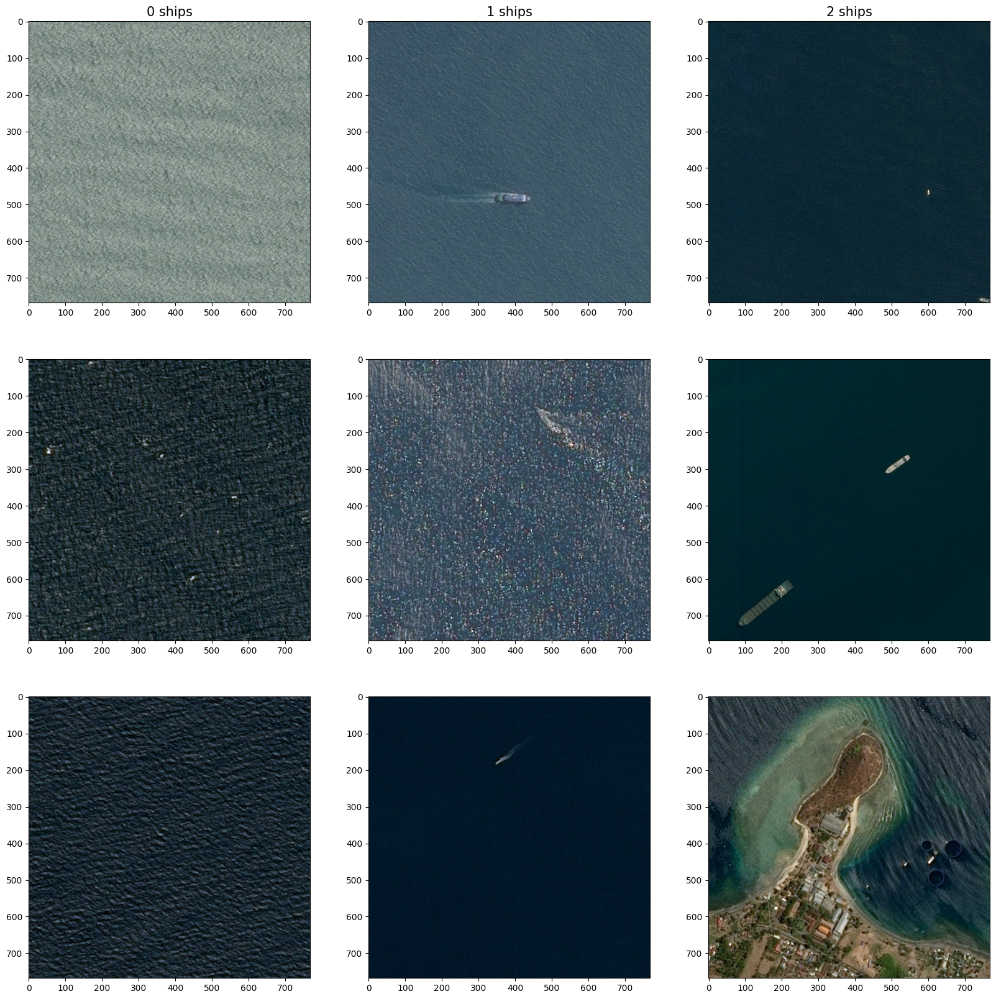

In [ ]:
fig, axs = plt.subplots(3, 3, figsize = (20, 20))
for i in range(3):
    for k in range(3):
        img_name = first_imgs_each_count.loc[first_imgs_each_count['ships'] == i, 'ImageId'].iloc[k]
        axs[k, i].imshow(imread(f"Train images/{img_name}"))
    axs[0, i].set_title(f'{i} ships', fontsize=15)

Highlight the area having ship in the above images (using the pixel information from the train_df.csv)

In [ ]:
import numpy as np
from skimage.morphology import label
import gc

gc.enable()

In [ ]:
train_image_dir = 'Train images'
test_image_dir = 'Test images'

def multi_rle_encode(img, **kwargs):
    '''
    Encode connected regions as separated masks
    '''
    labels = label(img)
    if img.ndim > 2:
        return [rle_encode(np.sum(labels==k, axis=2), **kwargs) for k in np.unique(labels[labels>0])]
    else:
        return [rle_encode(labels==k, **kwargs) for k in np.unique(labels[labels>0])]

# ref: https://www.kaggle.com/paulorzp/run-length-encode-and-decode
def rle_encode(img, min_max_threshold=1e-3, max_mean_threshold=None):
    '''
    img: numpy array, 1 - mask, 0 - background
    Returns run length as string formated
    '''
    if np.max(img) < min_max_threshold:
        return '' ## no need to encode if it's all zeros
    if max_mean_threshold and np.mean(img) > max_mean_threshold:
        return '' ## ignore overfilled mask
    pixels = img.T.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

# we know the shape from checking above
def rle_decode(mask_rle, shape=im_dim):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (height,width) of array to return
    Returns numpy array, 1 - mask, 0 - background
    '''
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0] * shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape).T  # Needed to align to RLE direction

def masks_as_image(in_mask_list):
    # Take the individual ship masks and create a single mask array for all ships
    all_masks = np.zeros(im_dim, dtype=np.uint8)
    for mask in in_mask_list:
        if isinstance(mask, str):
            all_masks |= rle_decode(mask)
    return all_masks

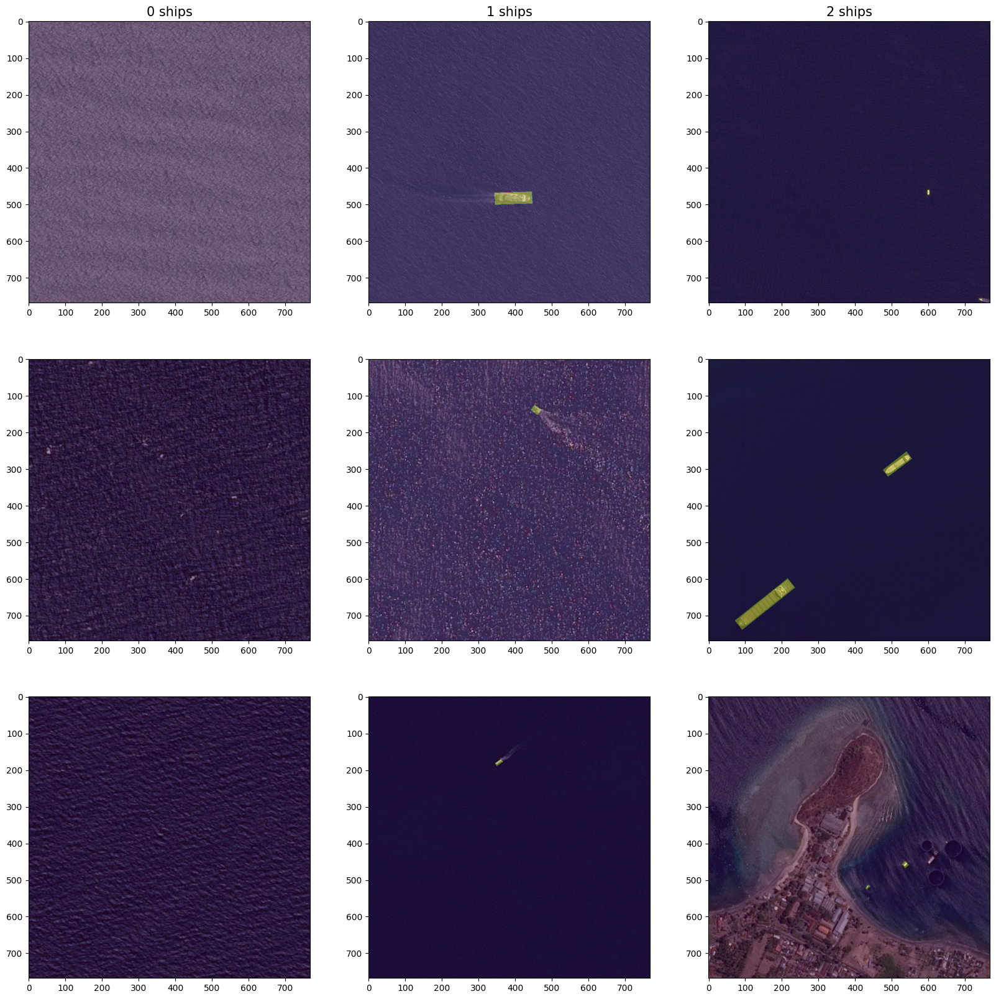

In [ ]:
fig, axs = plt.subplots(3, 3, figsize = (20, 20))
for i in range(3):
    for k in range(3):
        img_name = first_imgs_each_count.loc[first_imgs_each_count['ships'] == i, 'ImageId'].iloc[k]
        axs[k, i].imshow(imread(f"Train images/{img_name}"))
        rle = mask_df.loc[mask_df['ImageId'] == img_name, 'EncodedPixels']
        img_mask = masks_as_image(rle)
        axs[k, i].imshow(img_mask, alpha=0.4)
    axs[0, i].set_title(f'{i} ships', fontsize=15)

Plot some of the random test set images

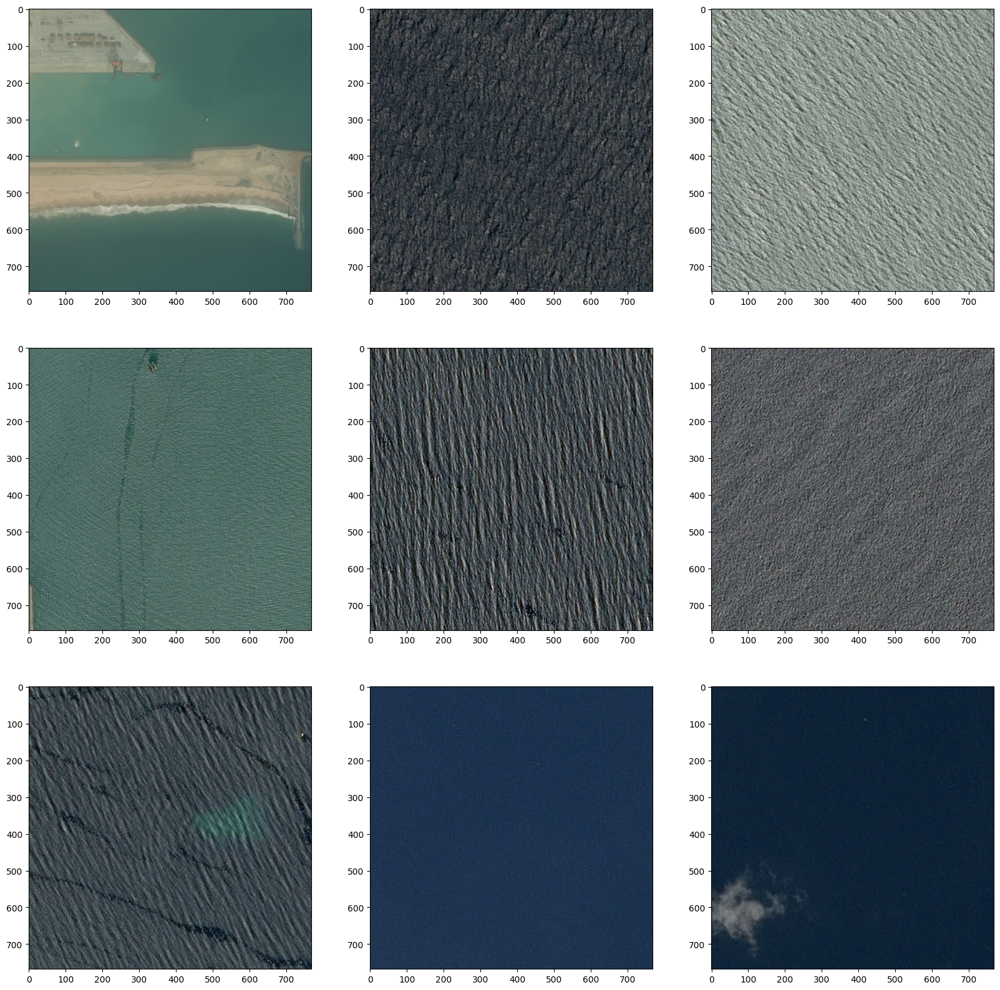

In [ ]:
fig, axs = plt.subplots(3, 3, figsize = (20, 20))
i = 0
k = 0
for im in os.listdir(test_image_dir):
    img_path = os.path.join(test_image_dir, im)
    axs[k, i].imshow(imread(img_path))
    i = i + 1 if k == 2 else i
    k = k + 1 if k < 2 else 0
    if i == 3:
        break

Perform object detection and submit your results in the format of sample_submission.csv file.`

In [ ]:
from sklearn.model_selection import train_test_split

train_ids, valid_ids = train_test_split(undersample_df, test_size=0.2, stratify=undersample_df['ships'])
train_df = pd.merge(mask_df, train_ids)
valid_df = pd.merge(mask_df, valid_ids)
print(train_df.shape[0], 'training masks')
print(valid_df.shape[0], 'validation masks')

78947 training masks
19726 validation masks


In [ ]:
def img_gtr(df, folder_path=train_image_dir, batch_size=32, image_scaling=(3, 3)):
    imgs = list(df.groupby('ImageId'))
    out_rgb = []
    out_mask = []
    while True:
        np.random.shuffle(imgs)
        for id, im_masks in imgs:
            img_path = f'{folder_path}/{id}'
            img = imread(img_path)
            mask = masks_as_image(im_masks['EncodedPixels'].values)
            mask = np.expand_dims(mask, -1).astype(np.float32)
            if image_scaling:
                img = img[::image_scaling[0], ::image_scaling[1]]
                mask = mask[::image_scaling[0], ::image_scaling[1]]
            out_rgb += [img]
            out_mask += [mask]
            if len(out_rgb) >= batch_size:
                yield np.stack(out_rgb, 0) / 255., np.stack(out_mask, 0)
                out_rgb, out_mask = [], []

In [ ]:
gc.collect()

30

In [ ]:
from keras import models, layers

The following is the model. We referenced the U-Net model and use a progression from 8 - 256, where each layer's number of filters is 2 times the previous layer's filters. U-Net architecture has shown promising results on different fields of application such as biomedical images recognition. As a result, we decided to use it in the custom model.

In [ ]:
def custom_model(input_shape, gaussian_noise=0.1, net_scaling=(1, 1)):
    '''
        A smaller scale U-Net
        e: encoder
        p: pooling
        ls: latent space
        u: uppooling
        c: skip connection
        d: decoder
        number following the alphabets: level
    '''

    input_img = layers.Input(input_shape)

    init_layer = layers.MaxPooling2D(net_scaling)(input_img)
    init_layer = layers.GaussianNoise(gaussian_noise)(init_layer)
    init_layer = layers.BatchNormalization()(init_layer)

    e1 = layers.Conv2D(8, (3, 3), activation='relu', padding='same')(init_layer)
    e1 = layers.Conv2D(8, (3, 3), activation='relu', padding='same')(e1)
    p1 = layers.MaxPooling2D()(e1)

    e2 = layers.Conv2D(16, (3, 3), activation='relu', padding='same')(p1)
    e2 = layers.Conv2D(16, (3, 3), activation='relu', padding='same')(e2)
    p2 = layers.MaxPooling2D()(e2)

    e3 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(p2)
    e3 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(e3)
    p3 = layers.MaxPooling2D()(e3)

    e4 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(p3)
    e4 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(e4)
    p4 = layers.MaxPooling2D()(e4)

    e5 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(p4)
    e5 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(e5)
    p5 = layers.MaxPooling2D()(e5)

    ls = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(p5)
    ls = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(ls)

    u5 = layers.UpSampling2D()(ls)
    c5 = layers.concatenate([u5, e5])
    d5 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c5)
    d5 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(d5)

    u4 = layers.UpSampling2D()(d5)
    c4 = layers.concatenate([u4, e4])
    d4 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c4)
    d4 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(d4)

    u3 = layers.UpSampling2D()(d4)
    c3 = layers.concatenate([u3, e3])
    d3 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(c3)
    d3 = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(d3)

    u2 = layers.UpSampling2D()(d3)
    c2 = layers.concatenate([u2, e2])
    d2 = layers.Conv2D(16, (3, 3), activation='relu', padding='same')(c2)
    d2 = layers.Conv2D(16, (3, 3), activation='relu', padding='same')(d2)

    u1 = layers.UpSampling2D()(d2)
    c1 = layers.concatenate([u1, e1])
    d1 = layers.Conv2D(8, (3, 3), activation='relu', padding='same')(c1)
    d1 = layers.Conv2D(8, (3, 3), activation='relu', padding='same')(d1)

    d = layers.Conv2D(1, (1, 1), activation='sigmoid')(d1)

    d = layers.UpSampling2D(net_scaling)(d)

    model = models.Model(inputs=[input_img], outputs=[d])

    return model


In [ ]:
import keras.backend as K
import tensorflow as tf
from tensorflow.math import subtract as tf_subtract

# ref: https://www.kaggle.com/code/hmendonca/u-net-model-with-submission?scriptVersionId=6151816&cellId=27
def IoU(y_true, y_pred):

    if K.max(y_true) == 0.0:
        y_true = tf_subtract(1., y_true)
        y_pred = tf_subtract(1., y_pred)

    intersection = K.sum(y_true * y_pred, axis=[1, 2, 3])
    union = K.sum(y_true, axis=[1, 2, 3]) + K.sum(y_pred, axis=[1, 2, 3]) - intersection
    return K.mean(intersection / union, axis=0)

# ref: https://stackoverflow.com/questions/72195156/correct-implementation-of-dice-loss-in-tensorflow-keras
def dice_coef_loss(y_true, y_pred, smooth=100):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    # print(y_true_f.shape, y_pred_f.shape)
    intersection = K.sum(y_true_f * y_pred_f)
    dice = (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    return -dice


In [ ]:
# A larger batch would increase the speed of the training but OOM keeps happening.
# 50 is an amount big enough where the model is still running
batch_size = 50
valid_batch_size = 100
# Use the original size of the image to keep all details
scaling = (1, 1)

train_gen = img_gtr(train_df, batch_size=batch_size, image_scaling=scaling)
valid_gen = img_gtr(valid_df, batch_size=valid_batch_size, image_scaling=scaling)
valid_x, valid_y = next(valid_gen)

In [ ]:
input_shape = (int(im_dim[0]), int(im_dim[1]), 3)

model = custom_model(input_shape, net_scaling=(3, 3))
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 768, 768, 3  0           []                               
                                )]                                                                
                                                                                                  
 max_pooling2d (MaxPooling2D)   (None, 256, 256, 3)  0           ['input_1[0][0]']                
                                                                                                  
 gaussian_noise (GaussianNoise)  (None, 256, 256, 3)  0          ['max_pooling2d[0][0]']          
                                                                                                  
 batch_normalization (BatchNorm  (None, 256, 256, 3)  12         ['gaussian_noise[0][0]']     

In [ ]:
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# Stop the model if the loss on validation data is not dropping
early_stopping = EarlyStopping(monitor="val_loss", mode="min", verbose=2, patience=5)

weight_path="best_model_weights.hdf5".format()
checkpoint = ModelCheckpoint(weight_path, monitor='val_loss', verbose=1, save_best_only=True, mode='min', save_weights_only=True)

# Reduce the learning to help the model converge
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.25, patience=10, verbose=1, mode='min', min_delta=0.0001, cooldown=0, min_lr=1e-5)

In [ ]:
from keras.optimizers import Adam

model.compile(optimizer=Adam(1e-4), loss=dice_coef_loss, metrics=['binary_accuracy', IoU])

In [ ]:
MAX_TRAIN_STEPS = 50
MAX_TRAIN_EPOCHS = 40

loss_history = model.fit(train_gen,
                         steps_per_epoch=MAX_TRAIN_STEPS,
                         epochs=MAX_TRAIN_EPOCHS,
                         validation_data=(valid_x, valid_y),
                         callbacks=[checkpoint, early_stopping, reduce_lr],)

Epoch 1/40
50/50 [==============================] - ETA: 0s - loss: -0.0056 - binary_accuracy: 0.5628 - IoU: 0.0028
Epoch 1: val_loss improved from inf to -0.00644, saving model to best_model_weights.hdf5
50/50 [==============================] - 48s 814ms/step - loss: -0.0056 - binary_accuracy: 0.5628 - IoU: 0.0028 - val_loss: -0.0064 - val_binary_accuracy: 0.3615 - val_IoU: 0.0025 - lr: 1.0000e-04
Epoch 2/40
50/50 [==============================] - ETA: 0s - loss: -0.0378 - binary_accuracy: 0.8009 - IoU: 0.0141
Epoch 2: val_loss improved from -0.00644 to -0.00707, saving model to best_model_weights.hdf5
50/50 [==============================] - 81s 2s/step - loss: -0.0378 - binary_accuracy: 0.8009 - IoU: 0.0141 - val_loss: -0.0071 - val_binary_accuracy: 0.0946 - val_IoU: 0.0029 - lr: 1.0000e-04
Epoch 3/40
50/50 [==============================] - ETA: 0s - loss: -0.0186 - binary_accuracy: 0.2262 - IoU: 0.0084
Epoch 3: val_loss improved from -0.00707 to -0.05576, saving model to best_mod

In [ ]:
model = custom_model(input_shape, net_scaling=(3, 3))
model.load_weights(weight_path)

1/1 [==============================] - 0s 24ms/step


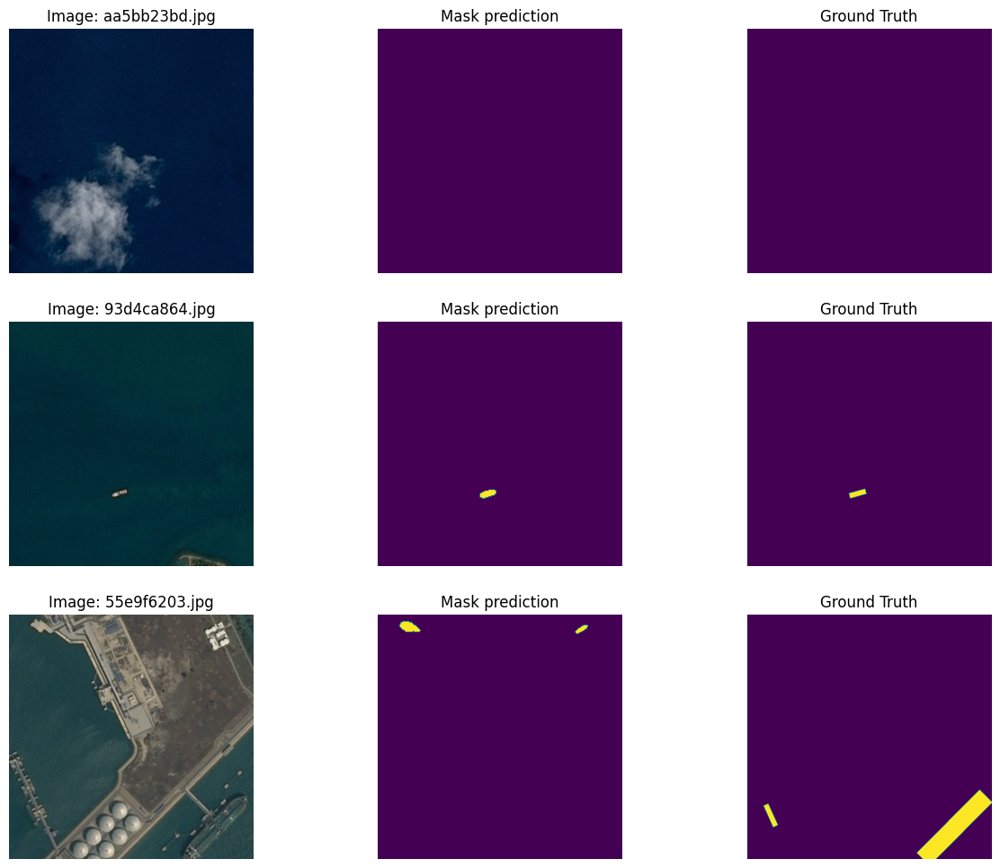

In [ ]:
samples = valid_df.query('ships < 3').groupby('ships').sample(1)
fig, axs = plt.subplots(samples.shape[0], 3, figsize=(15, samples.shape[0] * 4))
[ax.axis('off') for ax in axs.flatten()]

for (ax1, ax2, ax3), i_name in zip(axs, samples.ImageId.values):
    img = imread(os.path.join(train_image_dir, i_name))
    ax1.imshow(img)
    ax1.set_title('Image: ' + i_name)

    img = np.expand_dims(img, 0)
    pred = model.predict(img)[0]
    masks = masks_as_image(multi_rle_encode(pred))
    ax2.imshow(masks)
    ax2.set_title('Mask prediction')

    ground_truth = masks_as_image(mask_df.query(f'ImageId == "{i_name}"')['EncodedPixels'])
    ax3.imshow(ground_truth)
    ax3.set_title('Ground Truth')


In [ ]:
test_imgs = os.listdir(test_image_dir)

In [ ]:
len(test_imgs)

30809

In [ ]:
def test_imgs_gtr():
    test_imgs_arr = []
    test_imgs_name = []
    count = 0
    while count < len(test_imgs):
        for im_name in test_imgs:
            img_path = os.path.join(test_image_dir, im_name)
            test_imgs_arr.append(imread(img_path))
            test_imgs_name.append(im_name)
            if len(test_imgs_arr) >= 1000:
                yield test_imgs_arr, test_imgs_name
                test_imgs_arr = []
                test_imgs_name = []
            count += 1
    yield test_imgs_arr, test_imgs_name


In [ ]:
ts_img_gen = test_imgs_gtr()

In [ ]:
submissions = []
i = 0
for imgs, img_names in ts_img_gen:
    for data, name in zip(imgs, img_names):
        prediction = model.predict(np.expand_dims(data, 0), verbose=0)
        prediction = (prediction > 0.5).astype(int)
        prediction = prediction[0]
        rles = multi_rle_encode(prediction)
        if rles:
            submissions.extend([[name, rle] for rle in rles])
        else:
            submissions.append([name, np.NaN])
        i += 1

    print(f'Predicted {len(imgs)} images\' masks | Total predictions made: {i}')
    sub = pd.DataFrame(submissions, columns=['ImageId', 'EncodedPixels'])
    sub.to_csv('custom_model_submission.csv', mode='a')
    submissions = []


Predicted 1000 images' masks | Total predictions made: 1000
Predicted 1000 images' masks | Total predictions made: 2000
Predicted 1000 images' masks | Total predictions made: 3000
Predicted 1000 images' masks | Total predictions made: 4000
Predicted 1000 images' masks | Total predictions made: 5000
Predicted 1000 images' masks | Total predictions made: 6000
Predicted 1000 images' masks | Total predictions made: 7000
Predicted 1000 images' masks | Total predictions made: 8000
Predicted 1000 images' masks | Total predictions made: 9000
Predicted 1000 images' masks | Total predictions made: 10000
Predicted 1000 images' masks | Total predictions made: 11000
Predicted 1000 images' masks | Total predictions made: 12000
Predicted 1000 images' masks | Total predictions made: 13000
Predicted 1000 images' masks | Total predictions made: 14000
Predicted 1000 images' masks | Total predictions made: 15000
Predicted 1000 images' masks | Total predictions made: 16000
Predicted 1000 images' masks | To

In [ ]:
submission_csv = pd.read_csv('custom_model_submission.csv')
submission_csv.shape

(36064, 3)

In [ ]:
submission_csv['ImageId'].unique().shape

(30810,)

In [ ]:
submission_csv = submission_csv.drop(columns=[submission_csv.columns[0]])
submission_csv.to_csv('final_submission.csv')

Compute IOU of your results with test set and include in your report

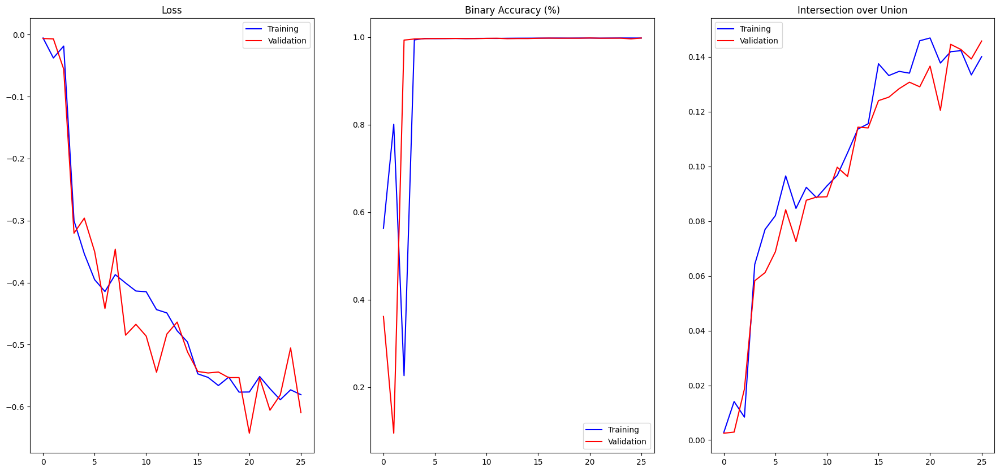

In [ ]:
def show_loss(loss_history):
    epochs = loss_history.epoch
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(22, 10))

    _ = ax1.plot(epochs, loss_history.history['loss'], 'b-',
                 epochs, loss_history.history['val_loss'], 'r-')
    ax1.legend(['Training', 'Validation'])
    ax1.set_title('Loss')

    _ = ax2.plot(epochs, loss_history.history['binary_accuracy'], 'b-',
                 epochs, loss_history.history['val_binary_accuracy'], 'r-')
    ax2.legend(['Training', 'Validation'])
    ax2.set_title('Binary Accuracy (%)')

    _ = ax3.plot(epochs, loss_history.history['IoU'], 'b-',
                 epochs, loss_history.history['val_IoU'], 'r-')
    ax3.legend(['Training', 'Validation'])
    ax3.set_title('Intersection over Union')

show_loss(loss_history)



Please check the pre_trained_model notebook